In [1]:
import os
import sys
import time
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage import io, transform
import warnings
warnings.filterwarnings("ignore")
import argparse
from tqdm import tqdm
from sklearn.model_selection import KFold

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms, utils, datasets, models
import torchvision.transforms.functional as TVF
from torch.utils.data import Dataset, DataLoader, random_split
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau


seed = 42
random.seed(seed)
np.random.seed(seed)

torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

os.environ['PYTHONHASHSEED'] = str(seed)
print(f"Seeds set to {seed} for deterministic results.")
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Session Device: {device} & {torch.cuda.device_count()}")

Seeds set to 42 for deterministic results.
Session Device: cuda & 1


In [2]:
class PMnet_usc(Dataset):
    def __init__(self, csv_file,
                 dir_dataset="USC/",               
                 transform= transforms.ToTensor()):
        
        self.ind_val = pd.read_csv(csv_file)
        self.dir_dataset = dir_dataset
        self.transform = transform

    def __len__(self):
        return len(self.ind_val)
    
    def __getitem__(self, idx):

        #Load city map
        self.dir_buildings = self.dir_dataset+ "map/"
        img_name_buildings = os.path.join(self.dir_buildings, str((self.ind_val.iloc[idx, 0]))) + ".png"
        image_buildings = np.asarray(io.imread(img_name_buildings))   
        
        #Load Tx (transmitter):
        self.dir_Tx = self.dir_dataset+ "Tx/" 
        img_name_Tx = os.path.join(self.dir_Tx, str((self.ind_val.iloc[idx, 0]))) + ".png"
        image_Tx = np.asarray(io.imread(img_name_Tx))

        #Load Rx (reciever): (not used in our training)
        self.dir_Rx = self.dir_dataset+ "Rx/" 
        img_name_Rx = os.path.join(self.dir_Rx, str((self.ind_val.iloc[idx, 0]))) + ".png"
        image_Rx = np.asarray(io.imread(img_name_Rx))

        #Load Power:
        self.dir_power = self.dir_dataset+ "pmap/" 
        img_name_power = os.path.join(self.dir_power, str(self.ind_val.iloc[idx, 0])) + ".png"
        image_power = np.asarray(io.imread(img_name_power))        

        inputs=np.stack([image_buildings, image_Tx], axis=2)

        if self.transform:
            inputs = self.transform(inputs).type(torch.float32)
            power = self.transform(image_power).type(torch.float32)

        return [inputs , power]


In [3]:
class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)


class Down(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)


class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        # if you have padding issues, see
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)


class TopKPercentActivation(nn.Module):
    def __init__(self, k_percent, temperature=10.0):
        super(TopKPercentActivation, self).__init__()
        self.k_percent = k_percent
        self.temperature = temperature

    def forward(self, x, mask):
        # Get masked elements
        masked_x = x * mask  # Mask out x values where mask is 0
        
        # Flatten last two dimensions for processing
        flattened_x = masked_x.view(x.size(0), x.size(1), -1)
        flattened_mask = mask.view(mask.size(0), mask.size(1), -1)
        
        # Compute number of elements to keep for each tensor
        masked_counts = flattened_mask.sum(dim=-1, keepdim=True)
        top_k_counts = (masked_counts * self.k_percent).to(torch.int64)  # Cast to int64
        
        # Sort masked elements in descending order along the last axis
        sorted_x, _ = torch.sort(flattened_x, dim=-1, descending=True)
        
        # Get threshold values for top k%
        top_k_thresholds = sorted_x.gather(
            dim=-1, index=top_k_counts.clamp(min=1) - 1
        )
        
        # Broadcast thresholds back to the original tensor shape
        thresholds = top_k_thresholds.unsqueeze(-1)
        
        # Set top k% values to 1 (where mask == 1)
        result = torch.where(
            (x > thresholds) & mask,  # Condition
            torch.tensor(1.0, device=x.device),  # True case
            torch.tensor(0.0, device=x.device)
        )
        
        return result, masked_counts


class SamplerNet(nn.Module):
    def __init__(self, n_channels, n_classes, target_sample_rate=0.4, temperature=10.0, bilinear=False):
        super(SamplerNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear
        self.target_sample_rate = target_sample_rate

        self.inc = (DoubleConv(n_channels, 64))
        self.down1 = (Down(64, 128))
        self.down2 = (Down(128, 256))
        self.down3 = (Down(256, 512))
        factor = 2 if bilinear else 1
        self.down4 = (Down(512, 1024 // factor))
        self.up1 = (Up(1024, 512 // factor, bilinear))
        self.up2 = (Up(512, 256 // factor, bilinear))
        self.up3 = (Up(256, 128 // factor, bilinear))
        self.up4 = (Up(128, 64, bilinear))
        self.outc = (OutConv(64, n_classes))
        self.top_k_activation = TopKPercentActivation(k_percent=target_sample_rate, 
                                                            temperature=temperature)

    def forward(self, inputs):
        x1 = self.inc(inputs)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return self.top_k_activation(logits, (inputs[:,0] == 0).unsqueeze(1))


In [4]:
class InterpolatorNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=False):
        super(InterpolatorNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = (DoubleConv(n_channels, 64))
        self.down1 = (Down(64, 128))
        self.down2 = (Down(128, 256))
        self.down3 = (Down(256, 512))
        factor = 2 if bilinear else 1
        self.down4 = (Down(512, 1024 // factor))
        self.up1 = (Up(1024, 512 // factor, bilinear))
        self.up2 = (Up(512, 256 // factor, bilinear))
        self.up3 = (Up(256, 128 // factor, bilinear))
        self.up4 = (Up(128, 64, bilinear))
        self.outc = (OutConv(64, n_classes))

    def forward(self, inputs):
        x1 = self.inc(inputs)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits


In [5]:
class InterpolatorLoss(nn.Module):
    def __init__(self, alpha=1.0):
        super(InterpolatorLoss, self).__init__()
        self.alpha = alpha  # Weight for MSE

    def forward(self, y_pred, y_true):
        mse_loss = torch.mean((y_pred - y_true) ** 2)
        return self.alpha * mse_loss


In [6]:
def plot_results(image1, image2, image3, titles=['Mask', 'Interpolated', 'Target']):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    images = [image1, image2, image3]
    for idx, image in enumerate(images):
        images[idx] = image[0,0].cpu().numpy()
    
    for i, (img, ax) in enumerate(zip(images, axes)):
        ax.imshow(img)
        ax.axis('off')
        
        if titles and i < len(titles):
            ax.set_title(titles[i])
    
    plt.tight_layout()
    plt.show()


In [7]:
def train(sampler, interpolator, train_hyper, train_loader, test_loader, loss_fn, optimizer, scheduler, epochs, save_path=""):
    best_val_loss, best_val_file = float("inf"), None
        
    for epoch in range(epochs):
        sampler.train()
        interpolator.train()
        epoch_total_loss = 0
        
        for inputs, targets in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            inputs = inputs.to(device)
            targets = targets.to(device)
            
            mask, _ = sampler(inputs)
            interpolated_outputs = interpolator(torch.cat([inputs[:,0].unsqueeze(1),\
                                                           targets * mask], dim=1))

            optimizer.zero_grad()
            loss = loss_fn(interpolated_outputs, targets)

            loss.backward()
            optimizer.step()

            epoch_total_loss += loss.item()
            
        # Epoch Summary
        num_batches = len(train_loader)        
        # Validation and LR scheduling
        val_total_loss = validate(sampler, interpolator, test_loader, loss_fn)
        scheduler.step(epoch_total_loss/num_batches)

        with torch.no_grad():
            inputs, targets = next(iter(train_loader))
            inputs = inputs.to(device)
            targets = targets.to(device)
            mask, num_ones = sampler(inputs)
            interpolated_outputs = interpolator(torch.cat([inputs[:,0].unsqueeze(1),\
                                                           targets * mask], dim=1))
            plot_results(targets * mask, interpolated_outputs, targets)
            print("Sample Rate:", (mask.view(mask.size(0), mask.size(1),\
                                            -1).sum(dim=-1, keepdim=True) / num_ones).mean())
        
        if val_total_loss < best_val_loss:
            print(f"Epoch {epoch+1} Summary:")
            print(f"Avg Loss: {epoch_total_loss/num_batches:.6f}")
            print(f"Epoch {epoch+1} - Test Total Loss: {val_total_loss}")
            # model_dict = {
            #     'model_state_dict': model.state_dict(),
            #     'optimizer_state_dict': optimizer.state_dict(),
            #     'test_loss': val_similarity_loss}
            ###
            # file_name = f"SamplerUNet_USC{train_hyper}_{epoch+1}_{model.target_sample_rate}_{val_similarity_loss}_pth.tar"
            # torch.save(model_dict, save_path + "/" + file_name) 
            best_val_loss = val_total_loss
            # best_val_file = file_name
            ###
            
    return best_val_loss, best_val_file


def validate(sampler, interpolator, test_loader, loss_fn):
    sampler.eval()
    interpolator.eval()
    total_loss = 0
    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs = inputs.to(device)
            targets = targets.to(device)
            
            mask, _ = sampler(inputs)
            interpolated_outputs = interpolator(torch.cat([inputs[:,0].unsqueeze(1),\
                                                           targets * mask], dim=1))

            loss = loss_fn(interpolated_outputs, targets)
            total_loss += loss.item()
    
    return total_loss/len(test_loader)


Training Started...


Epoch 1/30: 100%|██████████| 761/761 [10:17<00:00,  1.23it/s]


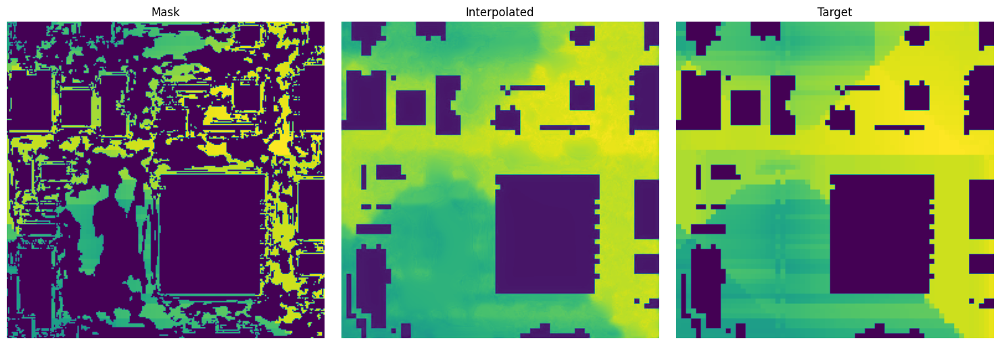

Sample Rate: tensor(0.4000, device='cuda:0')
Epoch 1 Summary:
Avg Loss: 0.003366
Epoch 1 - Test Total Loss: 0.0003934469584775455


Epoch 2/30: 100%|██████████| 761/761 [08:00<00:00,  1.58it/s]


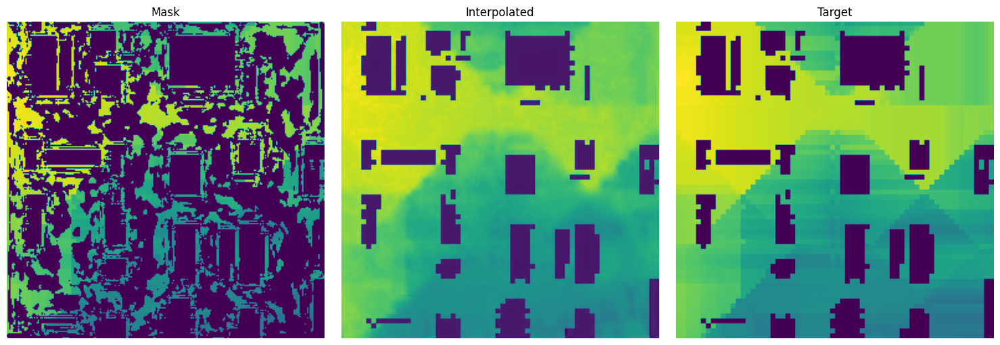

Sample Rate: tensor(0.4000, device='cuda:0')
Epoch 2 Summary:
Avg Loss: 0.000682
Epoch 2 - Test Total Loss: 0.0003523987301025559


Epoch 3/30: 100%|██████████| 761/761 [07:54<00:00,  1.61it/s]


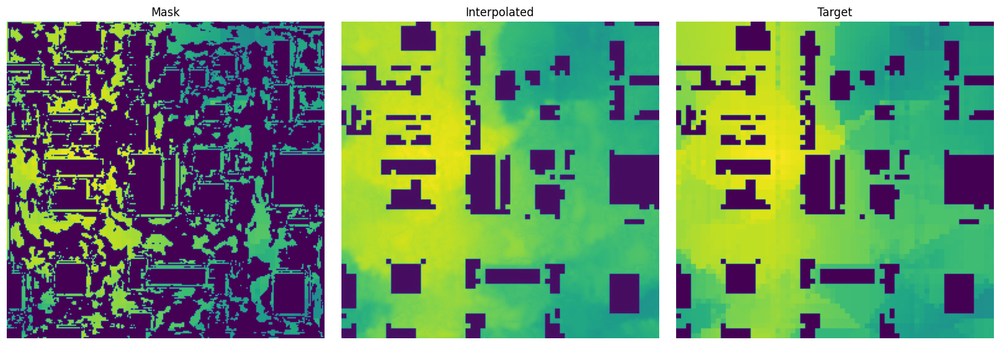

Sample Rate: tensor(0.4000, device='cuda:0')
Epoch 3 Summary:
Avg Loss: 0.000499
Epoch 3 - Test Total Loss: 0.00030407616722334115


Epoch 4/30: 100%|██████████| 761/761 [07:51<00:00,  1.62it/s]


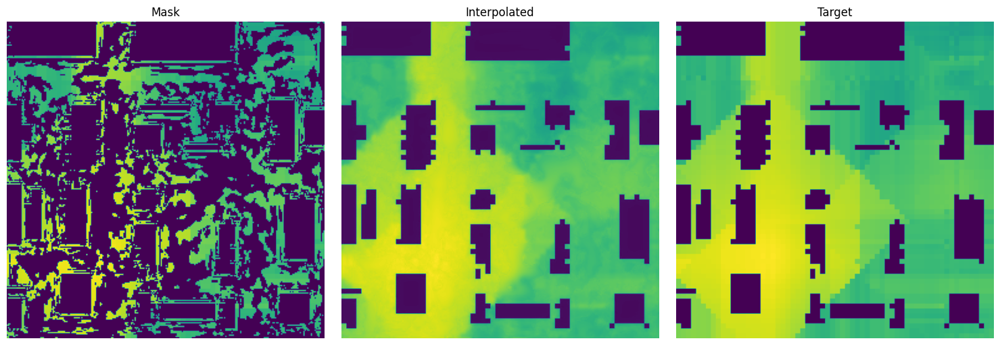

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 5/30: 100%|██████████| 761/761 [07:46<00:00,  1.63it/s]


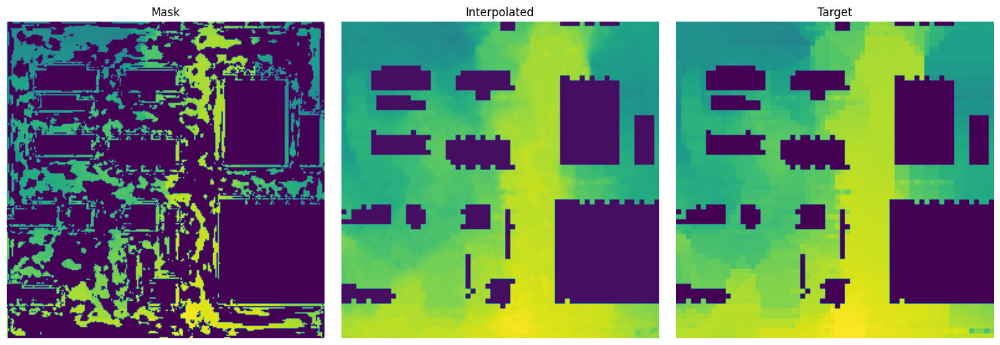

Sample Rate: tensor(0.4000, device='cuda:0')
Epoch 5 Summary:
Avg Loss: 0.000429
Epoch 5 - Test Total Loss: 0.00021573023231217335


Epoch 6/30: 100%|██████████| 761/761 [07:48<00:00,  1.62it/s]


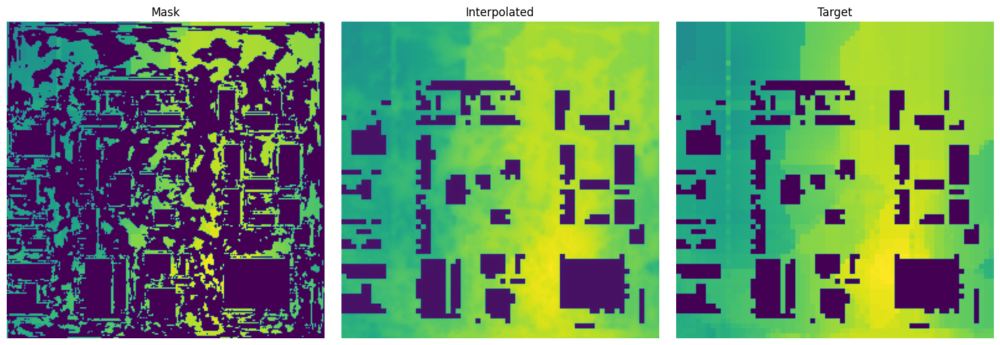

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 7/30: 100%|██████████| 761/761 [07:54<00:00,  1.60it/s]


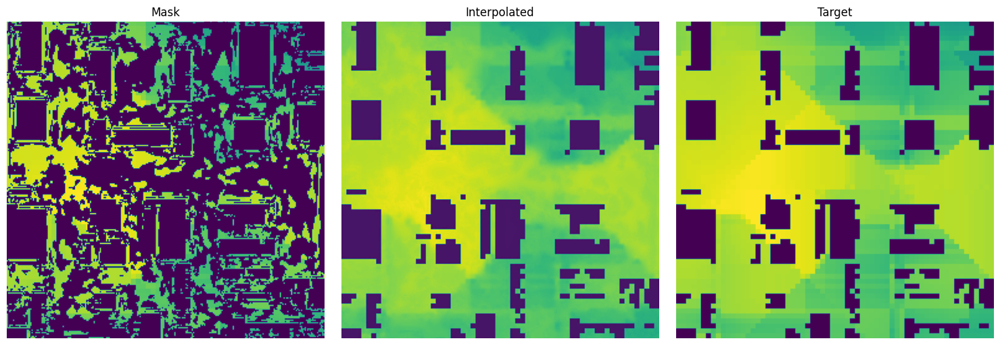

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 8/30: 100%|██████████| 761/761 [07:49<00:00,  1.62it/s]


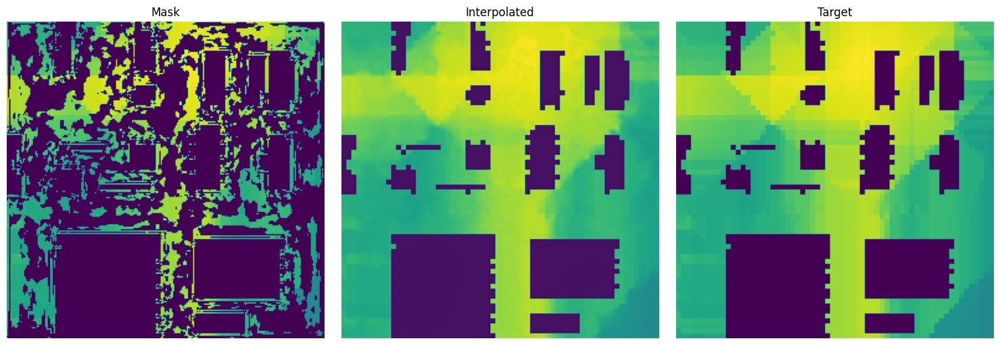

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 9/30: 100%|██████████| 761/761 [07:43<00:00,  1.64it/s]


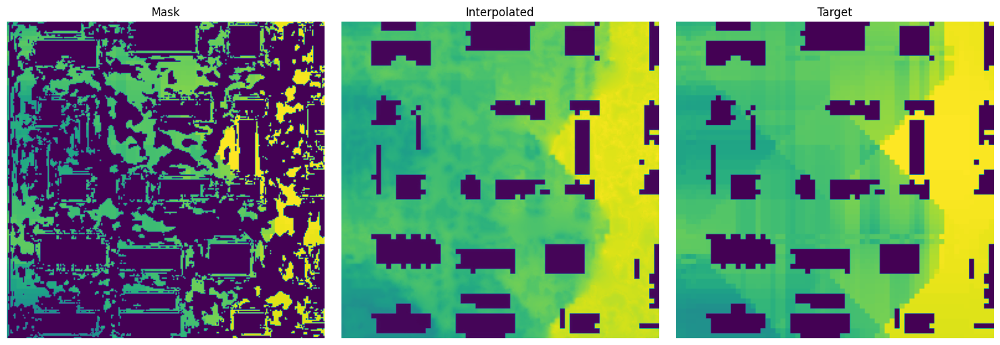

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 10/30: 100%|██████████| 761/761 [07:44<00:00,  1.64it/s]


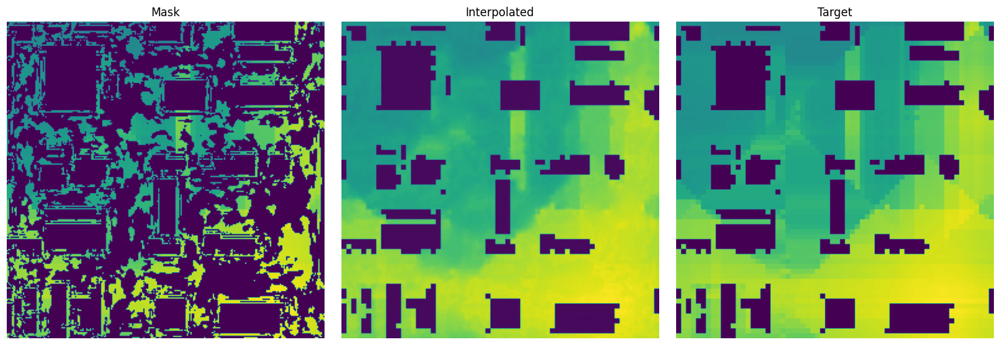

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 11/30: 100%|██████████| 761/761 [07:53<00:00,  1.61it/s]


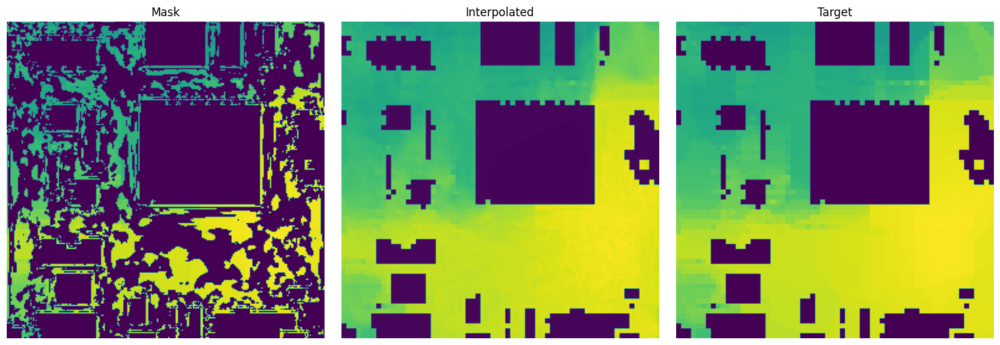

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 12/30: 100%|██████████| 761/761 [07:58<00:00,  1.59it/s]


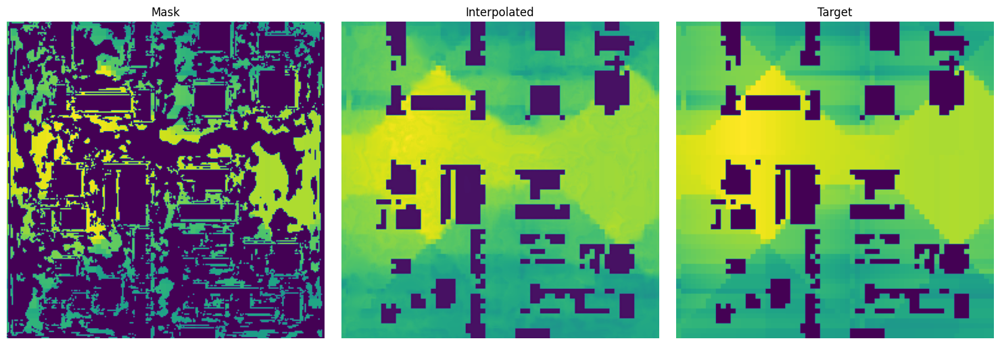

Sample Rate: tensor(0.4000, device='cuda:0')
Epoch 12 Summary:
Avg Loss: 0.000275
Epoch 12 - Test Total Loss: 0.00020786999015951852


Epoch 13/30: 100%|██████████| 761/761 [07:51<00:00,  1.61it/s]


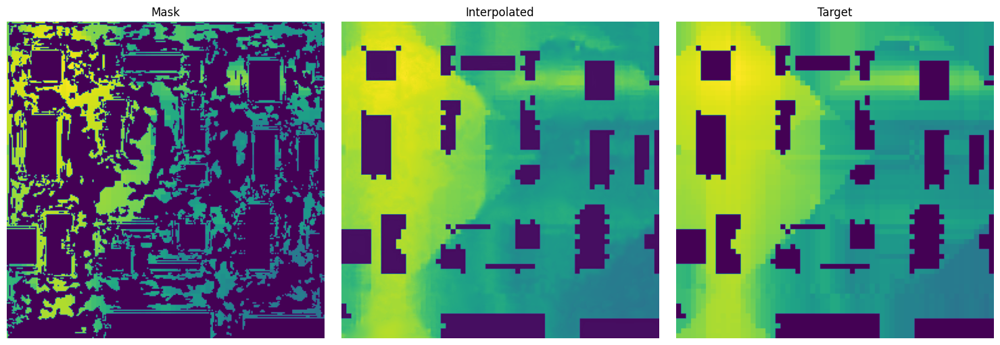

Sample Rate: tensor(0.4000, device='cuda:0')
Epoch 13 Summary:
Avg Loss: 0.000271
Epoch 13 - Test Total Loss: 0.00017393903861051495


Epoch 14/30: 100%|██████████| 761/761 [07:54<00:00,  1.60it/s]


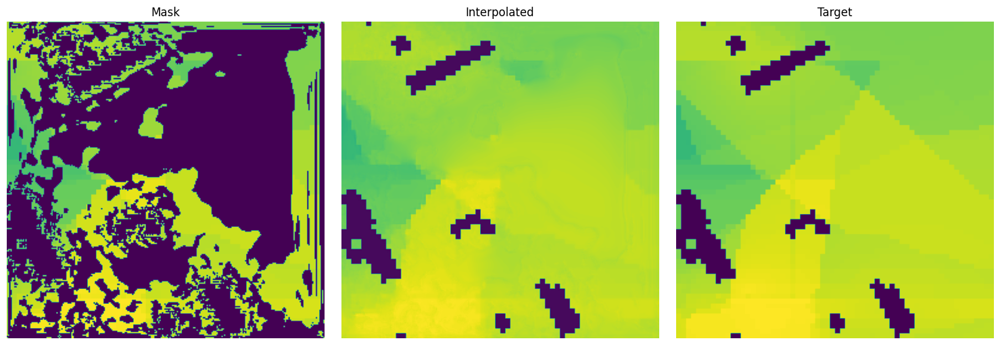

Sample Rate: tensor(0.4000, device='cuda:0')
Epoch 14 Summary:
Avg Loss: 0.000275
Epoch 14 - Test Total Loss: 0.00014676466114582563


Epoch 15/30: 100%|██████████| 761/761 [08:00<00:00,  1.58it/s]


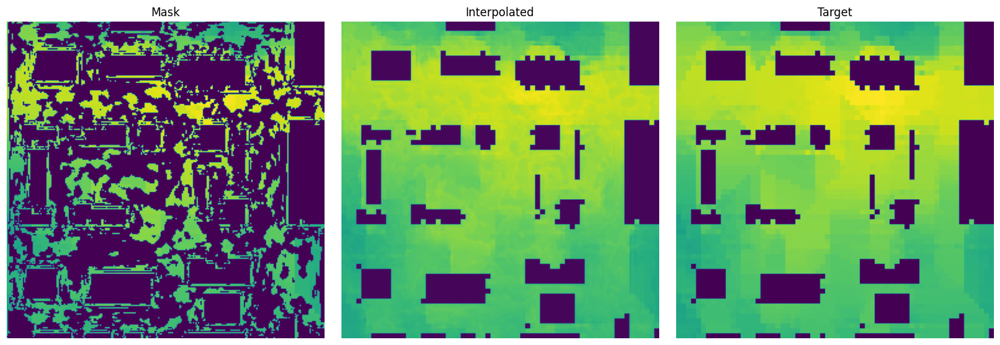

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 16/30: 100%|██████████| 761/761 [07:56<00:00,  1.60it/s]


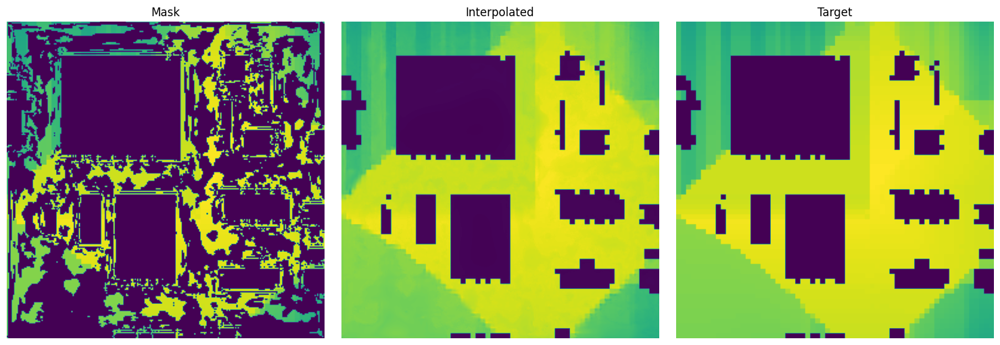

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 17/30: 100%|██████████| 761/761 [07:55<00:00,  1.60it/s]


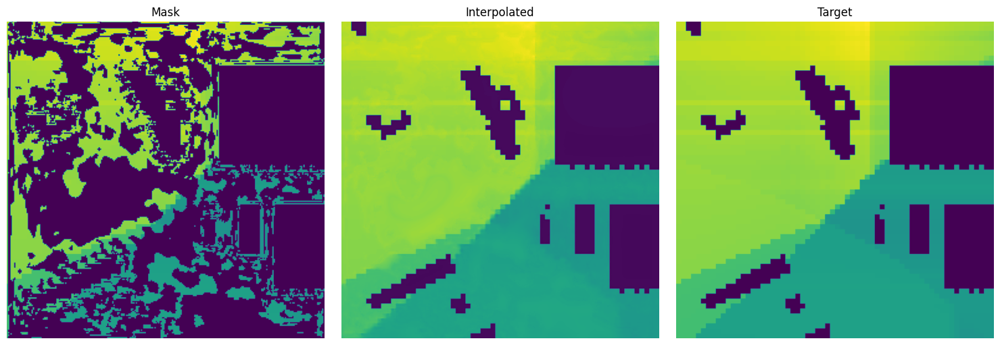

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 18/30: 100%|██████████| 761/761 [07:58<00:00,  1.59it/s]


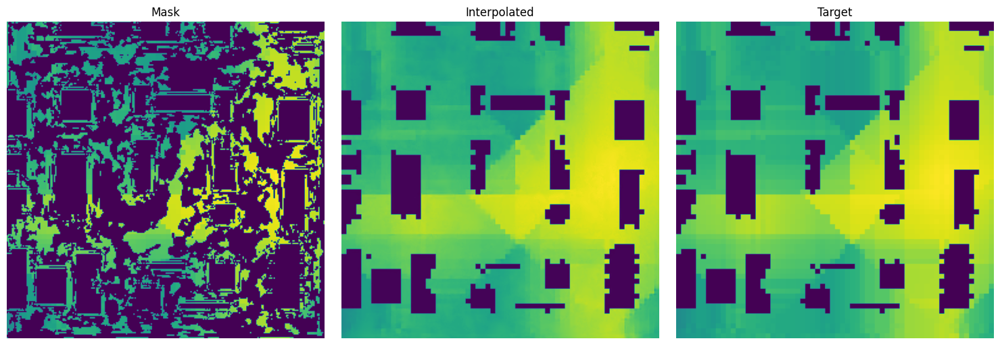

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 19/30: 100%|██████████| 761/761 [07:48<00:00,  1.62it/s]


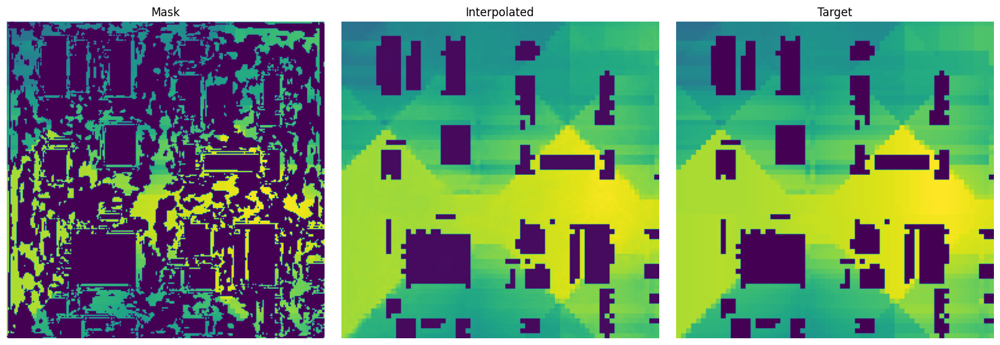

Sample Rate: tensor(0.4000, device='cuda:0')
Epoch 19 Summary:
Avg Loss: 0.000165
Epoch 19 - Test Total Loss: 0.00010580971675677497


Epoch 20/30: 100%|██████████| 761/761 [07:54<00:00,  1.61it/s]


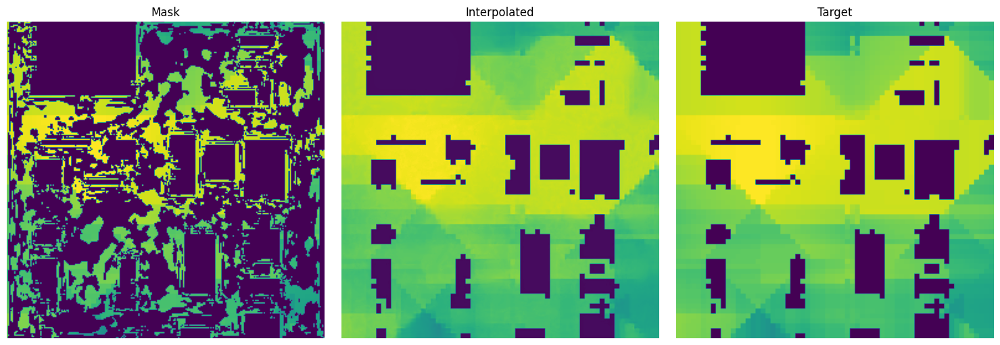

Sample Rate: tensor(0.4000, device='cuda:0')
Epoch 20 Summary:
Avg Loss: 0.000132
Epoch 20 - Test Total Loss: 8.853664035062885e-05


Epoch 21/30: 100%|██████████| 761/761 [07:58<00:00,  1.59it/s]


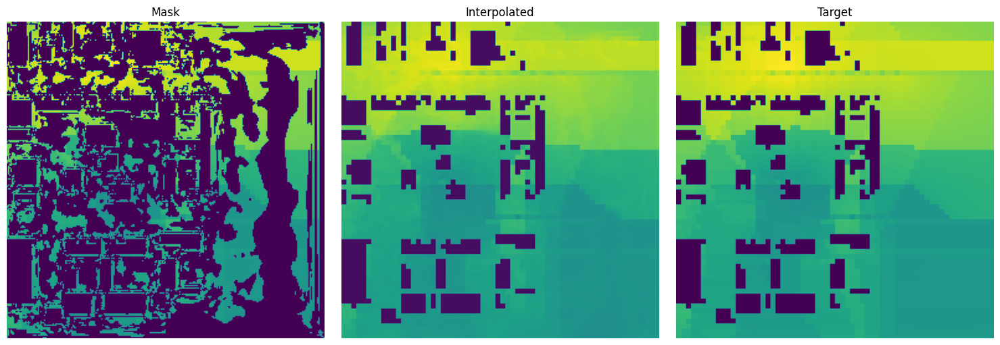

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 22/30: 100%|██████████| 761/761 [07:59<00:00,  1.59it/s]


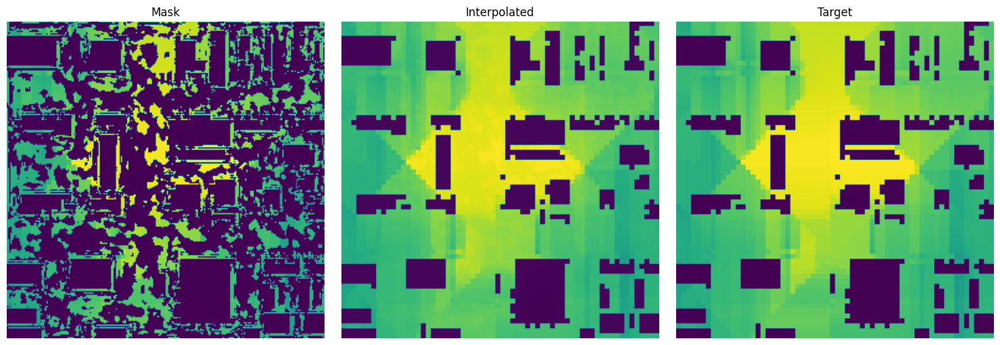

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 23/30: 100%|██████████| 761/761 [07:56<00:00,  1.60it/s]


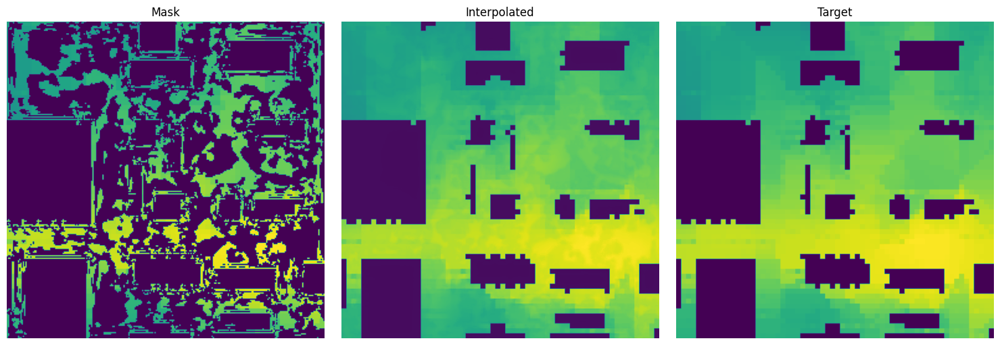

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 24/30: 100%|██████████| 761/761 [07:48<00:00,  1.62it/s]


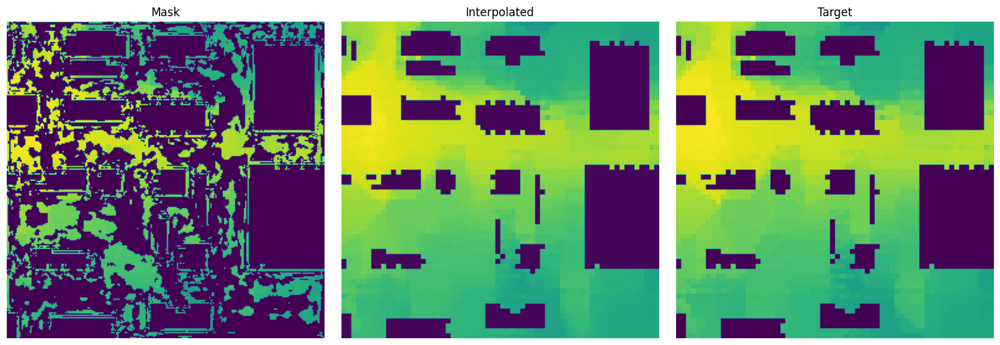

Sample Rate: tensor(0.4000, device='cuda:0')
Epoch 24 Summary:
Avg Loss: 0.000118
Epoch 24 - Test Total Loss: 5.217183008607165e-05


Epoch 25/30: 100%|██████████| 761/761 [07:54<00:00,  1.60it/s]


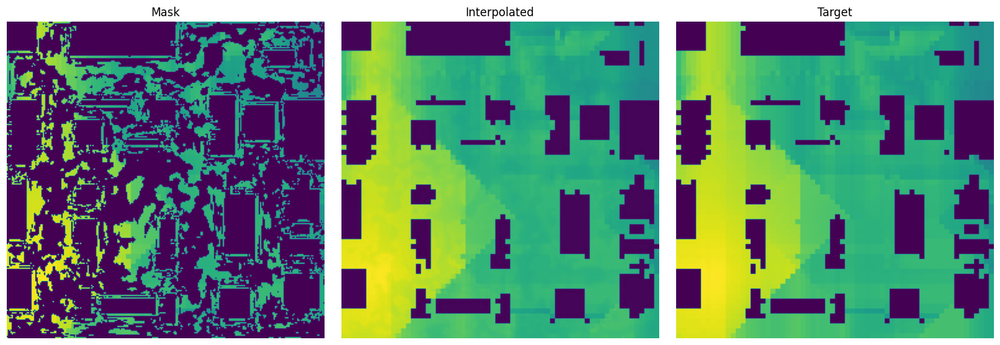

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 26/30: 100%|██████████| 761/761 [07:52<00:00,  1.61it/s]


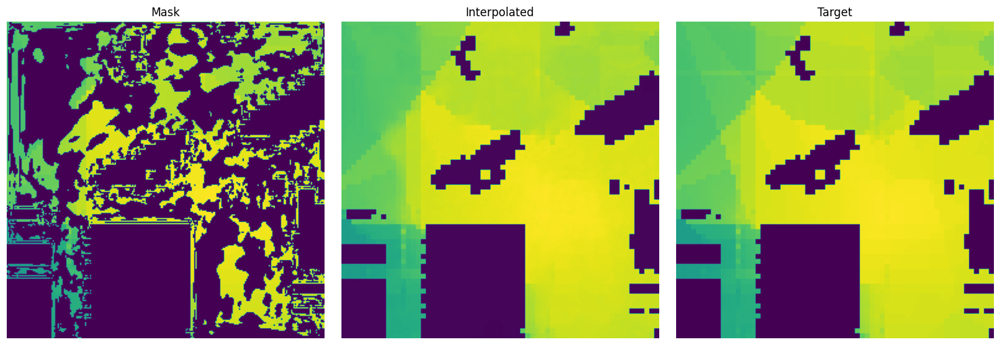

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 27/30: 100%|██████████| 761/761 [07:55<00:00,  1.60it/s]


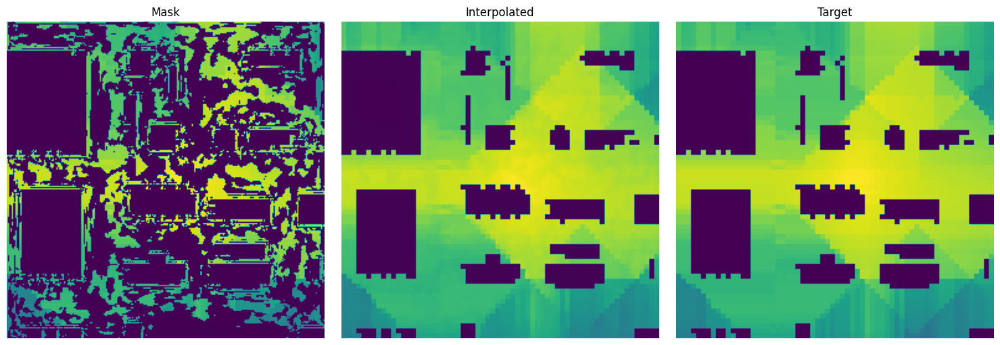

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 28/30: 100%|██████████| 761/761 [07:52<00:00,  1.61it/s]


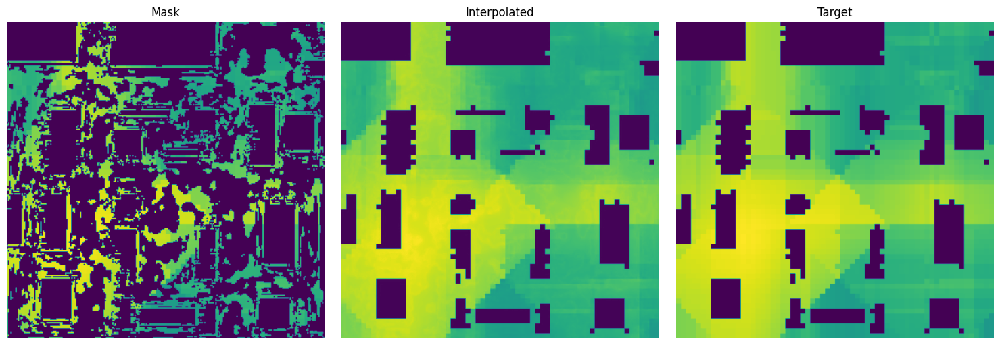

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 29/30: 100%|██████████| 761/761 [08:00<00:00,  1.58it/s]


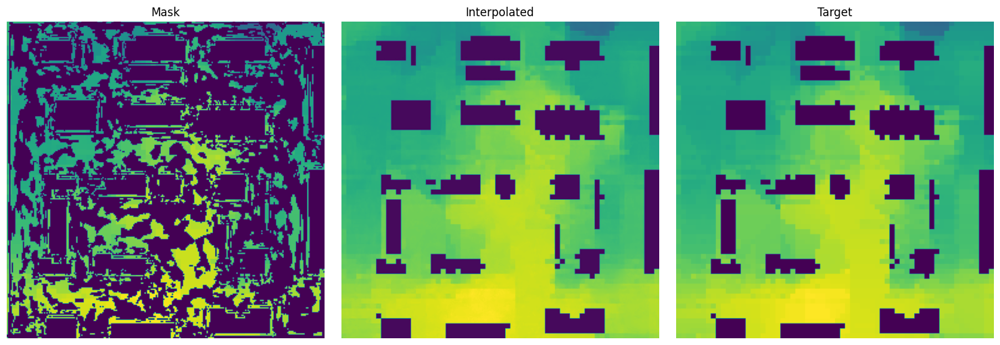

Sample Rate: tensor(0.4000, device='cuda:0')


Epoch 30/30: 100%|██████████| 761/761 [08:01<00:00,  1.58it/s]


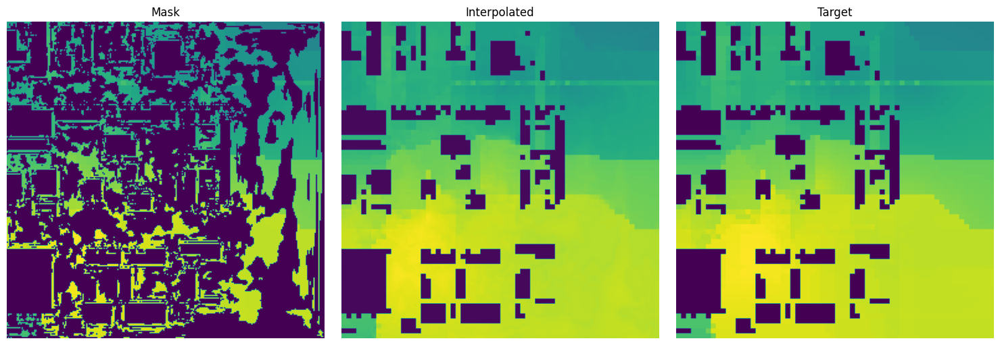

Sample Rate: tensor(0.4000, device='cuda:0')
{'0.8-0.2-0.4': 5.217183008607165e-05}
Training Ends...


In [8]:
if __name__ == "__main__":
    
    data_root = "/kaggle/input/pmnet-data/USC/"
    csv_file = os.path.join(data_root,'Data_coarse_train.csv')
    num_of_maps = 19016
    ddf = pd.DataFrame(np.arange(1,num_of_maps))
    ddf.to_csv('usc.csv', index=False)
    
    pathloss_data = PMnet_usc(csv_file = "usc.csv", dir_dataset=data_root)
    dataset_size = len(pathloss_data)
    
    pmnet_train_size = int(dataset_size * 0.8)
    pmnet_test_size = dataset_size - pmnet_train_size
    pmnet_train_dataset, pmnet_test_dataset = random_split(pathloss_data, [pmnet_train_size, pmnet_test_size], \
                                            generator=torch.Generator(device="cpu"))
    
    train_hyper = 0.8
    sampler_train_size = int(pmnet_train_size * train_hyper)
    sampler_test_size = pmnet_train_size - sampler_train_size
    sampler_train_dataset, sampler_test_dataset = random_split(pmnet_train_dataset, [sampler_train_size, sampler_test_size], \
                                            generator=torch.Generator(device="cpu"))
    sampler_train =  DataLoader(sampler_train_dataset, batch_size=16, shuffle=True, generator=torch.Generator(device="cpu"))
    sampler_test = DataLoader(sampler_test_dataset, batch_size=16, shuffle=False, generator=torch.Generator(device="cpu"))
    
    best_test_losses, best_test_files = {}, {}
    start, end, interval = 0.4, 0.4, 1
    # path = "Final_USC_Save/"+f"{round(train_hyper, 1)}-{round(1 - train_hyper, 1)}-[{start}-{end}]"
    # if not os.path.exists(path):
    # 	os.mkdir(path)
    
    print("Training Started...")
    for target_sample_rate in np.linspace(start, end, interval):
        key = f"{round(train_hyper, 1)}-{round(1 - train_hyper, 1)}-{round(target_sample_rate, 1)}"    
        sampler = SamplerNet(n_channels=2, n_classes=1, target_sample_rate=target_sample_rate, temperature=10.0, bilinear=True).to(device);
        interpolator = InterpolatorNet(n_channels=2, n_classes=1, bilinear=True).to(device)
        # loss_fn = ImprovedSamplerLoss(target_sample_rate=target_sample_rate, 
        #                             alpha=1.0, beta=0.2, gamma=0.4, delta=0.1).to(device)
        loss_fn = InterpolatorLoss().to(device)
        
        optimizer = optim.Adam(list(sampler.parameters()) + list(interpolator.parameters()), lr=1e-3)
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2, verbose=True)
        
        best_test_loss, _ = train(sampler, interpolator, train_hyper, sampler_train, sampler_test, loss_fn, optimizer, scheduler, epochs=30)
        best_test_losses[key] = best_test_loss
        # best_test_files[key] = best_test_file
    
    print(best_test_losses)
    # print(best_test_files)
    print("Training Ends...")
